# Covid19 - Brazil (Cities) Basic Geographic Analysis
- by Marcelo Rovai
- 27 April 2020 and updated 15 May 21

Datasets:
- Worldometers Daily Data: https://www.worldometers.info/coronavirus/

- Confirmed cases by day, using information from the news. 
    - Covid19br dataset is available at GitHub: https://github.com/wcota/covid19br, 

- Raw data by city compiled from original dataset provided by Brasil.IO 
    - (https://brasil.io/dataset/covid19/caso/).

Thanks to: 
- Wesley Cota (https://wesleycota.com), PhD candidate - Complex Networks/Physics (Universidade Federal de Viçosa - Brazil and Universidad de Zaragoza - Spain) 
- Alvaro Justen(https://blog.brasil.io/author/alvaro-justen.html) from Brasil.IO

License: Creative Commons Attribution-ShareAlike 4.0 International
(CC BY-SA 4.0)](https://creativecommons.org/licenses/by-sa/4.0/)

More information: 
- https://wcota.me/covid19br and 
- https://brasil.io/covid19/

run script:
`$ python get_cv19_brazil.py`

## Main Libraries and setup

In [1]:
import warnings
from cv_util_func import *
import bar_chart_race as bcr
import imageio
from PIL import Image
from unicodedata import normalize
from shapely.geometry import Point, Polygon
import geopandas as gpd
import plotly.graph_objs as go
import plotly
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

print(
    '\n[INFO] Starting Covid19 - Brazil (Cities) Basic Geographic Analysis - WAIT'
)


[INFO] Starting Covid19 - Brazil (Cities) Basic Geographic Analysis - WAIT


## Initialization

In [2]:
warnings.filterwarnings("ignore")

pd.set_option('display.float_format', lambda x: '%.f' % x)
pd.options.display.float_format = '{:,}'.format
mpl.rcParams['figure.dpi'] = 150
plt.style.use('seaborn-paper')

## definitions

In [3]:
capital_cities = [
    'Belém/PA', 'Fortaleza/CE', 'Recife/PE', 'Manaus/AM', 'Rio de Janeiro/RJ',
    'São Luís/MA', 'São Paulo/SP', 'Maceió/AL', 'Rio Branco/AC', 'Vitória/ES',
    'Macapá/AP', 'Boa Vista/RR', 'Porto Velho/RO', 'João Pessoa/PB',
    'Salvador/BA', 'Natal/RN', 'Teresina/PI', 'Aracaju/SE', 'Brasília/DF',
    'Goiânia/GO', 'Porto Alegre/RS', 'Cuiabá/MT', 'Curitiba/PR', 'Palmas/TO',
    'Belo Horizonte/MG', 'Florianópolis/SC', 'Campo Grande/MS'
]

In [4]:
today = datetime.datetime.today()

## Datasets

In [5]:
# Plot WM Table
worldmetersLink = "https://www.worldometers.info/coronavirus/"
plot_wm_table('World', worldmetersLink, show=True, save=False)
plot_wm_table('South America', worldmetersLink, show=True, save=False)
plot_wm_table('Brazil', worldmetersLink, show=True, save=False)


World - Worldometers Daily Data

Today is 2021-01-28 11:05:47.532826 
- Total infected = 101.548.107 
- New Cases = 131.430 
- Total Deaths = 2.187.034 
- New Deaths = 4.464 
- Recovered = 73.457.881 
- Serious-Critical = 140.669 
- Mild Condition = 25.903.192



South America - Worldometers Daily Data

Today is 2021-01-28 11:05:51.990050 
- Total infected = 15.553.280 
- New Cases = 2.866 
- Total Deaths = 408.020 
- New Deaths = 62 
- Recovered = 13.692.642 
- Serious-Critical = 1.822 
- Mild Condition = 1.452.618



Brazil - Worldometers Daily Data

Today is 2021-01-28 11:05:54.629068 
- Total infected = 9.000.485 
- New Cases = 0 
- Total Deaths = 220.237 
- New Deaths = 0 
- Recovered = 7.798.655 
- Serious-Critical = 0 
- Mild Condition = 981.593


### Covid19 - Number of total cases by city & State

In [6]:
dt, dt_st, dt_tm, dt_tm_city, dt_state, total_cases, deaths, cfr = get_brazil_cv_data(
    today)

# Plot State Table

dt_st = dt_st.fillna(0)
dt_st['recovered'] = dt_st['recovered'].astype('int64')
dt_st['suspects'] = dt_st['suspects'].astype('int64')
dt_st['tests'] = dt_st['tests'].astype('int64')

date_today = list(dt_st.date[-2:-1])[0]
dt_st_today = dt_st[dt_st.date == date_today]

dx = dt_st_today.sort_values('deaths', ascending=False)
plot_table(dx, show=True, save=False)


Today is 2021/1/28. Dataset with 5596 observations.


Total number of cases in Brasil at 1/28: 9,005,619 (220329 fatal) with a CFR of 2.45%


In [7]:
# Timeline of Brazil Total cases cases
plot_cases(dt_tm, 'TOTAL', y_scale='linear', n_0=1_000, show=True, save=False)
plot_cases(dt_tm, 'TOTAL', y_scale='log', n_0=1_000, show=True, save=False)

In [8]:
plot_cases(dt_tm, 'Itajubá/MG', y_scale='linear', n_0=1600, show=True, save=False)

In [9]:
plot_cases(dt_tm, 'Santa Rita do Sapucaí/MG', y_scale='linear', n_0=500, show=True, save=False)

In [31]:
plot_cases(dt_tm, 'Campinas/SP', y_scale='linear', n_0=500, show=True, save=False)

In [10]:
# Timeline of cases per top-cities

top_cities = list(dt.sort_values('totalCases', ascending=False)[:10].city)

In [11]:
# Timeline New Deaths versus Previus Week
plot_mov_ave_deaths_last_week(dt_tm,
                              'TOTAL',
                              y_scale='linear',
                              n_0=100,
                              mov=7,
                              show=True,
                              save=False)

In [12]:
tst = plot_mov_ave_deaths_last_week_2(dt_tm,
                                  'TOTAL',
                                  y_scale='linear',
                                  n_0=3,
                                  mov=7,
                                  graph='line',
                                  show=True,
                                  save=False,
                                  rect=True,
                                  x0='2020-12-24',
                                  x1='2021-01-04',
                                  text="Christmas and New Year's Eve") 

In [13]:
tst = plot_mov_ave_deaths_last_week_2(dt_tm,
                                  'Santa Rita do Sapucaí/MG',
                                  y_scale='linear',
                                  n_0=3,
                                  mov=1,
                                  graph='line',
                                  show=True,
                                  save=False,
                                  rect=True,
                                  x0='2020-12-24',
                                  x1='2021-01-04',
                                  text="Christmas and New Year's Eve") 

In [33]:
tst = plot_mov_ave_deaths_last_week_2(dt_tm,
                                  'Campinas/SP',
                                  y_scale='linear',
                                  n_0=3,
                                  mov=1,
                                  graph='bar',
                                  show=True,
                                  save=False,
                                  rect=True,
                                  x0='2020-12-24',
                                  x1='2021-01-04',
                                  text="Christmas and New Year's Eve") 

## Capital Cities

In [14]:
for city in capital_cities:
    tst = plot_mov_ave_deaths_last_week_2(dt_tm,
                                      city,
                                      y_scale='linear',
                                      n_0=3,
                                      mov=7,
                                      graph='line',
                                      show=True,
                                      save=False,
                                      rect=True,
                                      x0='2020-12-24',
                                      x1='2021-01-04',
                                      text="Christmas and New Year's Eve") 

## special graphics

In [15]:

tst = plot_mov_ave_deaths_last_week_2(dt_tm,
                                      'Campinas/SP',
                                      y_scale='linear',
                                      n_0=3,
                                      mov=7,
                                      graph='line',
                                      show=True,
                                      save=False,
                                      rect=True,
                                      x0='2020-12-24',
                                      x1='2021-01-04',
                                      text="Christmas and New Year's Eve")

In [16]:

tst = plot_mov_ave_deaths_last_week_2(dt_tm,
                                      'Osasco/SP',
                                      y_scale='linear',
                                      n_0=3,
                                      mov=7,
                                      graph='line',
                                      show=True,
                                      save=False,
                                      rect=True,
                                      x0='2020-12-24',
                                      x1='2021-01-04',
                                      text="Christmas and New Year's Eve")

## GeoData (Brasil & Municipalities)

In [17]:
br_shp, br_cities = load_geodata()

Number of Brazilian Cities: 5,570
Total Brazilian Population: 210,147,125
Total Brazilian Territory : 8,985,590.0 km2 (aprox.)
Average Demografic Density : 23.0 hab/km2 (aprox.)


### Mapping CoronaVirus data

#### Plot State Maps

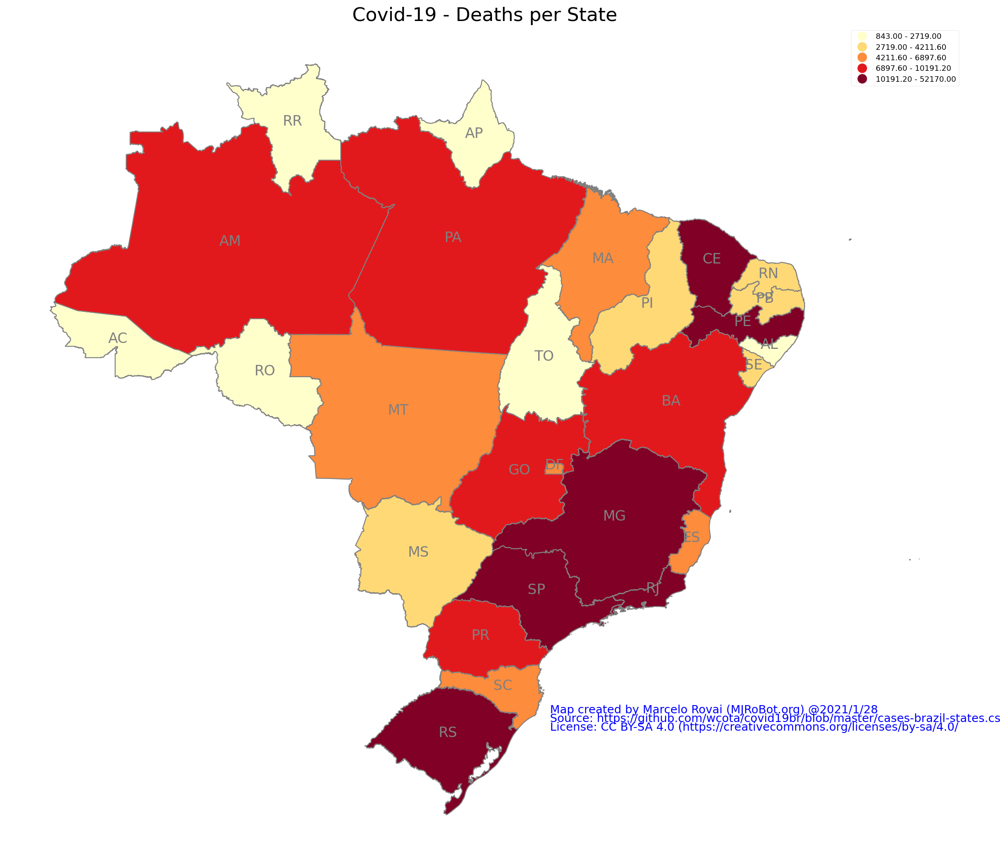

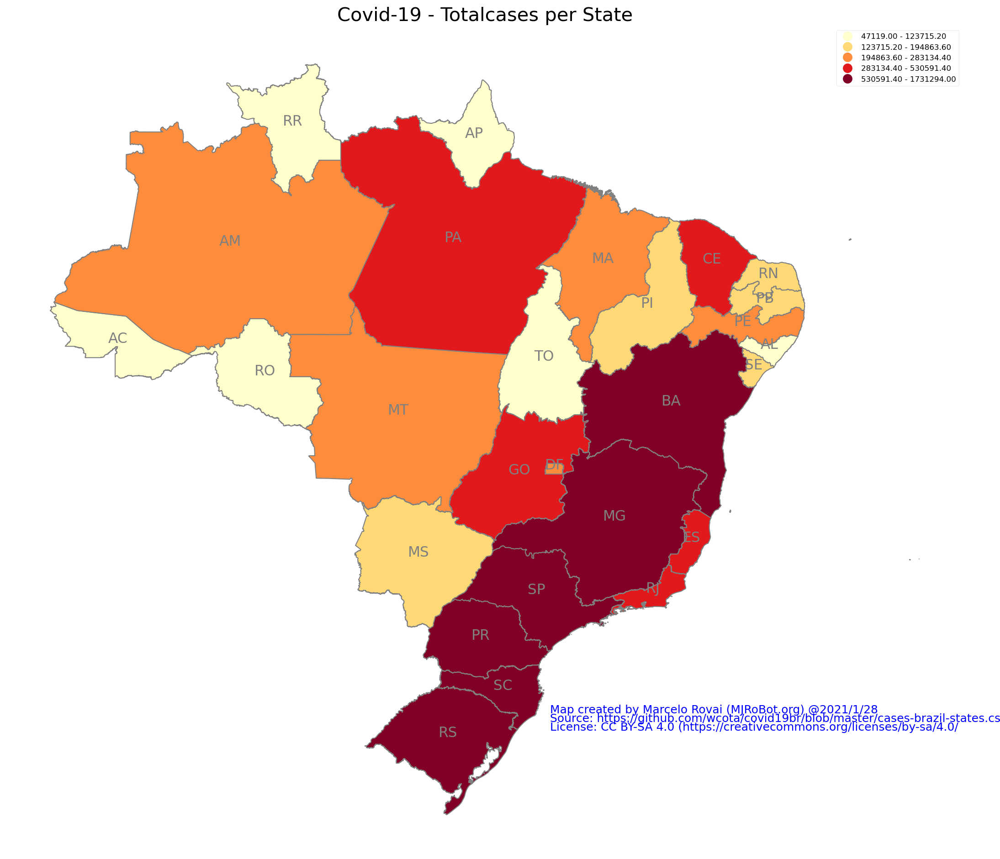

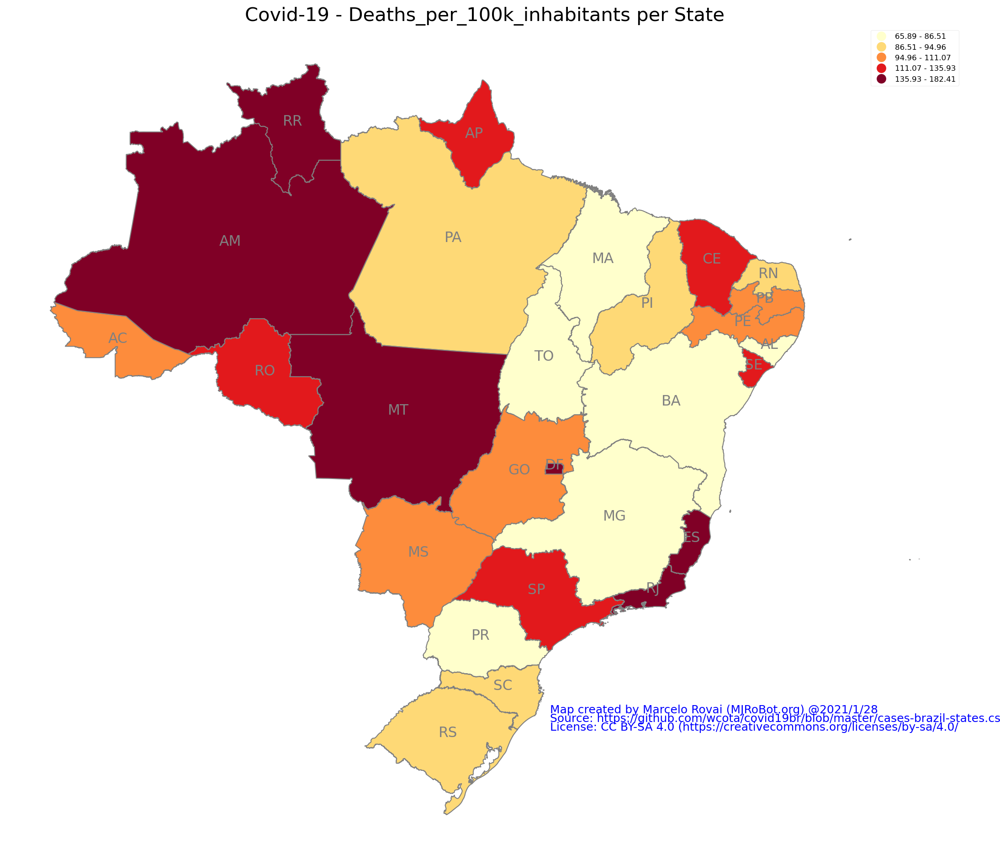

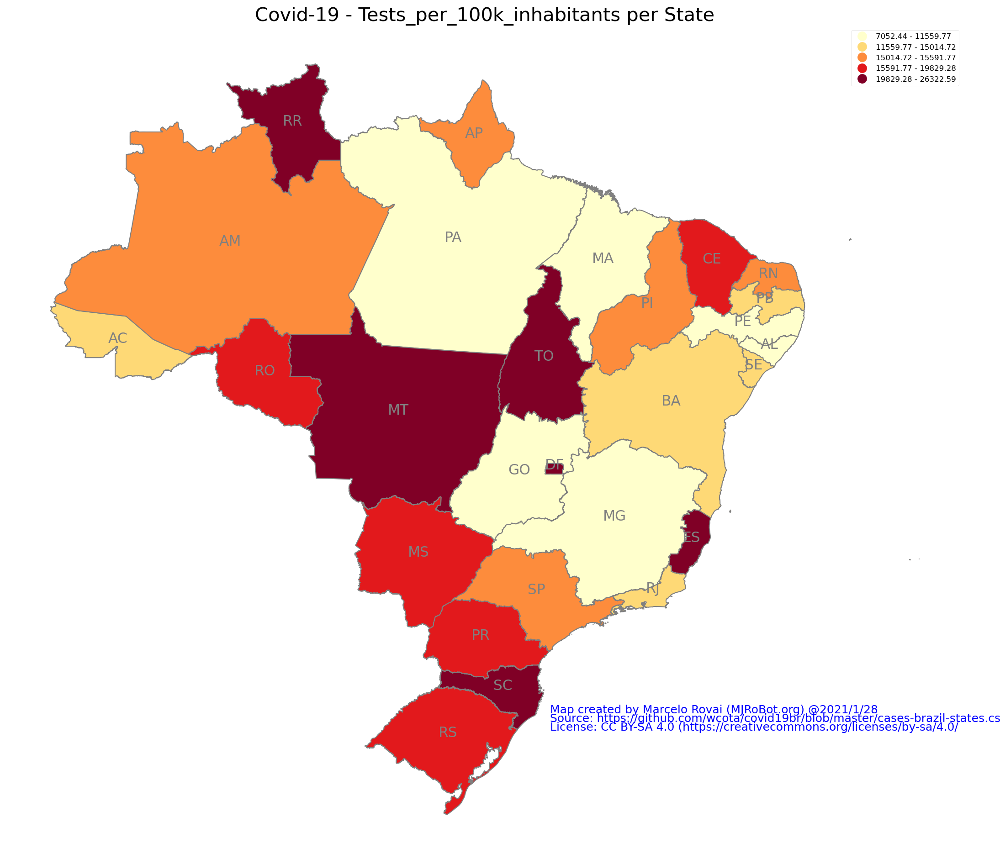

In [18]:
state = dt_st_today.copy()
state.rename(columns={'state': 'UF'}, inplace=True)

state = pd.merge(br_shp, state, on='UF')

plot_state_map(state, 'deaths', show=True, save=False)
plot_state_map(state, 'totalCases', show=True, save=False)
plot_state_map(state, 'deaths_per_100k_inhabitants', show=True, save=False)
plot_state_map(state, 'tests_per_100k_inhabitants', show=True, save=False)

### Nationwide Analysis

In [19]:
date = datetime.datetime.today()
cv_city, deaths_city, cv_city_pnt, deaths_city_pnt, total_cases, deaths, cfr, number_cities_cases, number_cities_deaths = get_Brazil_data(
    dt, br_shp, br_cities)

perc_cases = round((number_cities_cases / 5570) * 100, 0)
perc_deaths = round((number_cities_deaths / 5570) * 100, 0)

geo = [
    'Total number of Cases', 'Total number of Deaths', 'CFR [%]',
    'Total number of Brazil cities', 'Number of Identified cities with cases',
    'Brazilian cities with cases [%]',
    'Number of Identified cities with deaths',
    'Brazilian cities with deaths [%]'
]
data_geo = [
    total_cases, deaths, cfr, 5570, number_cities_cases, perc_cases,
    number_cities_deaths, perc_deaths
]

plot_geo_table(today, geo, data_geo, show=True, save=False)

Brazil: Total number of Covid19 cases at 1/28: 9,005,619 (220,329 fatal) in 5,570 cities with a CFR of 2.45%


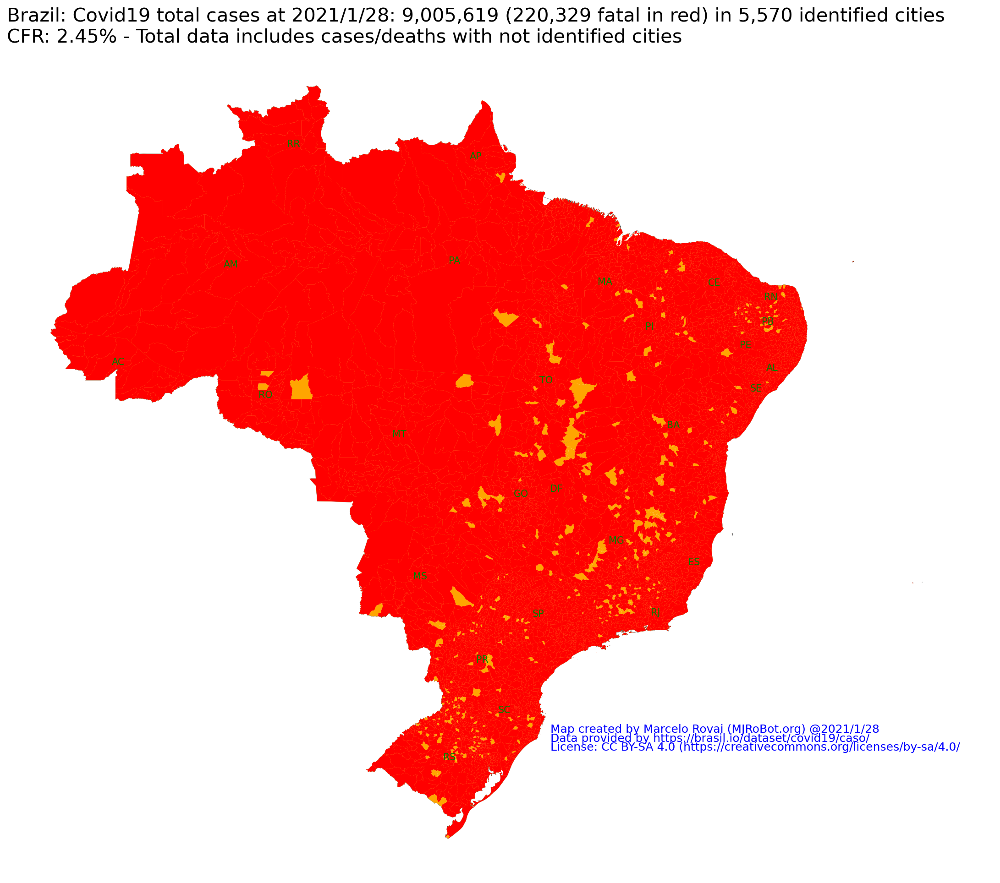

In [20]:
plt_Brasil_cities(cv_city,
                  deaths_city,
                  date,
                  total_cases,
                  deaths,
                  cfr,
                  br_shp,
                  br_cities,
                  deaths_only=False)

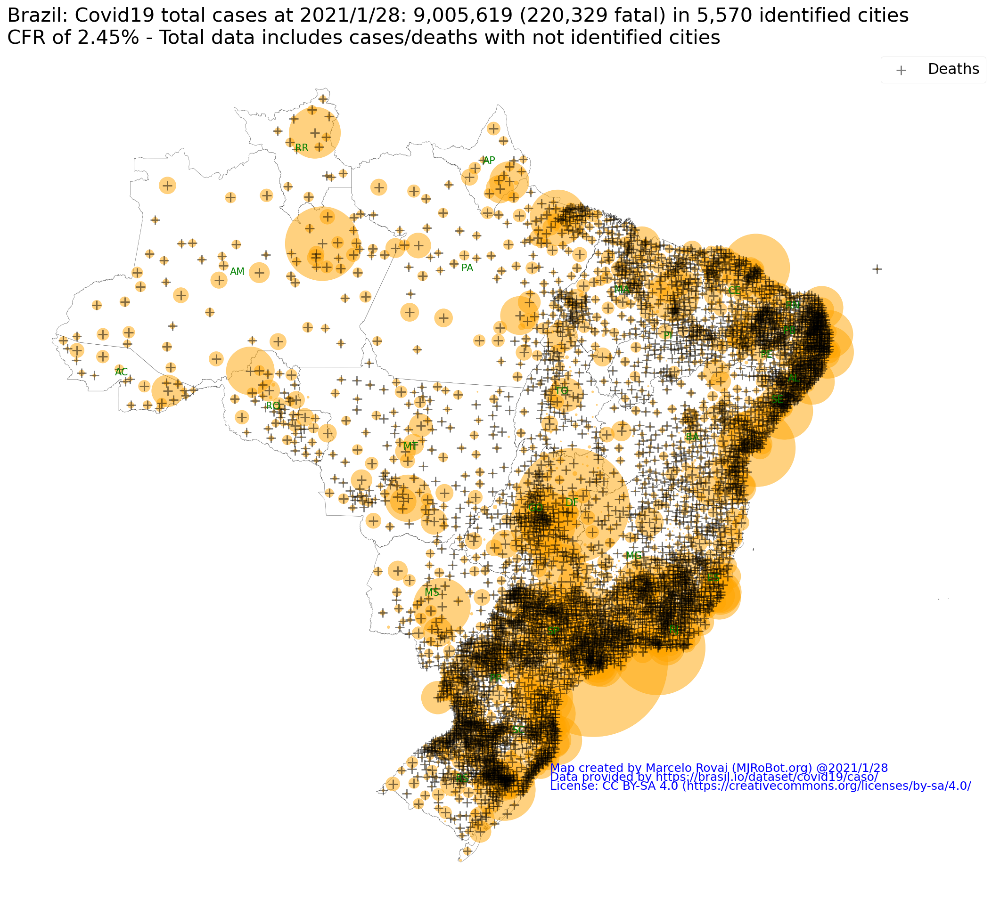

In [21]:
plt_Brasil_cv_metrics(cv_city_pnt,
                      deaths_city_pnt,
                      date,
                      total_cases,
                      deaths,
                      cfr,
                      br_shp,
                      br_cities,
                      n=0.05)

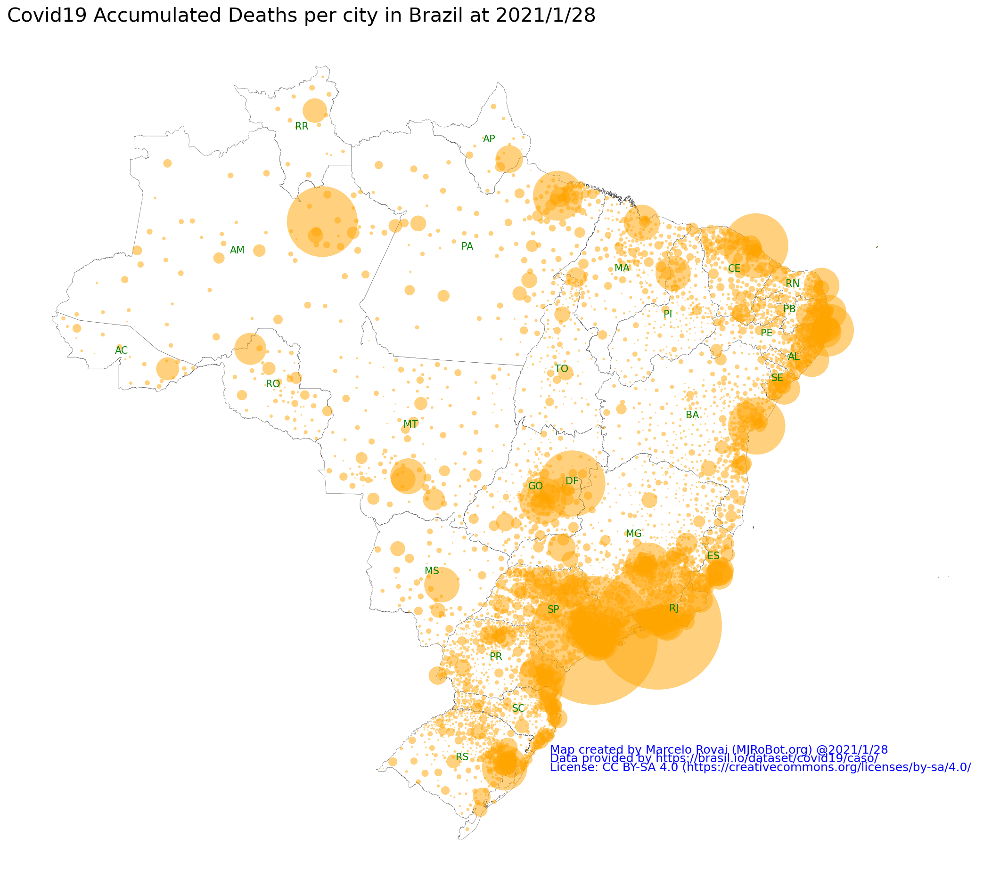

In [22]:
plt_Brasil_cv_metrics(cv_city_pnt,
                      deaths_city_pnt,
                      date,
                      total_cases,
                      deaths,
                      cfr,
                      br_shp,
                      br_cities,
                      metrics='deaths',
                      n=1)

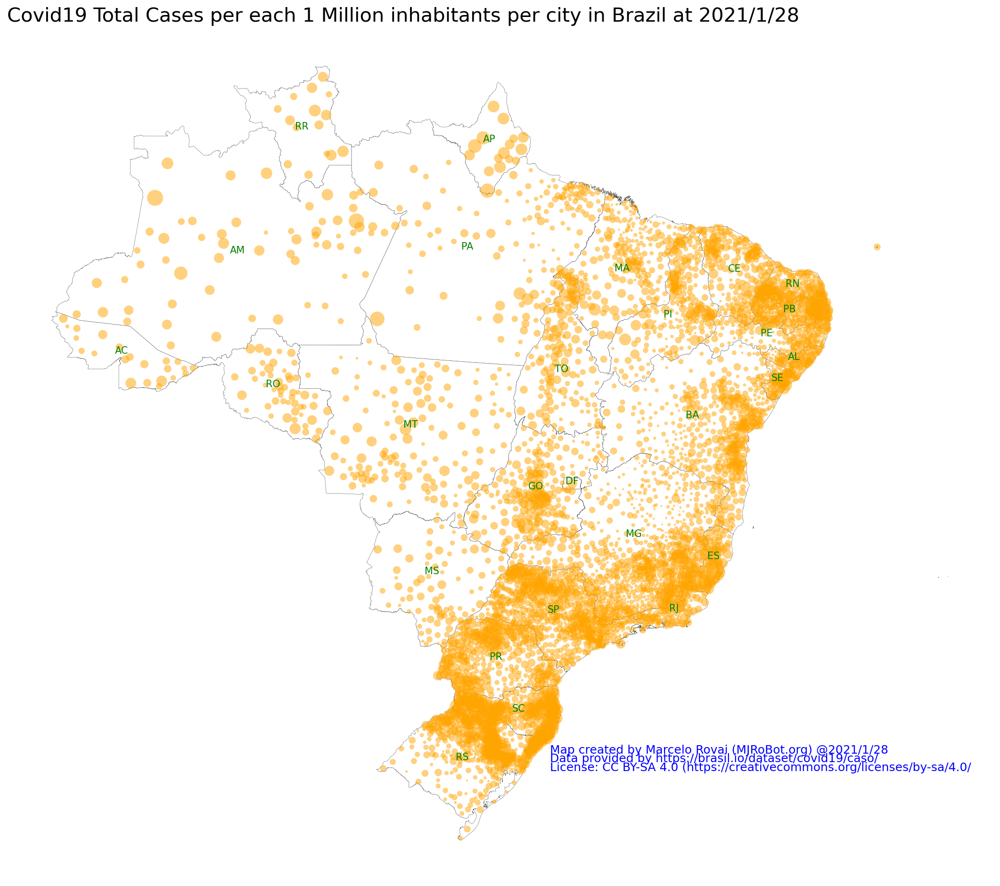

In [23]:
# Other Pandemic metrics maps
plt_Brasil_cv_metrics(cv_city_pnt,
                      deaths_city_pnt,
                      date,
                      total_cases,
                      deaths,
                      cfr,
                      br_shp,
                      br_cities,
                      metrics='TotalCases/1M pop',
                      n=0.001)

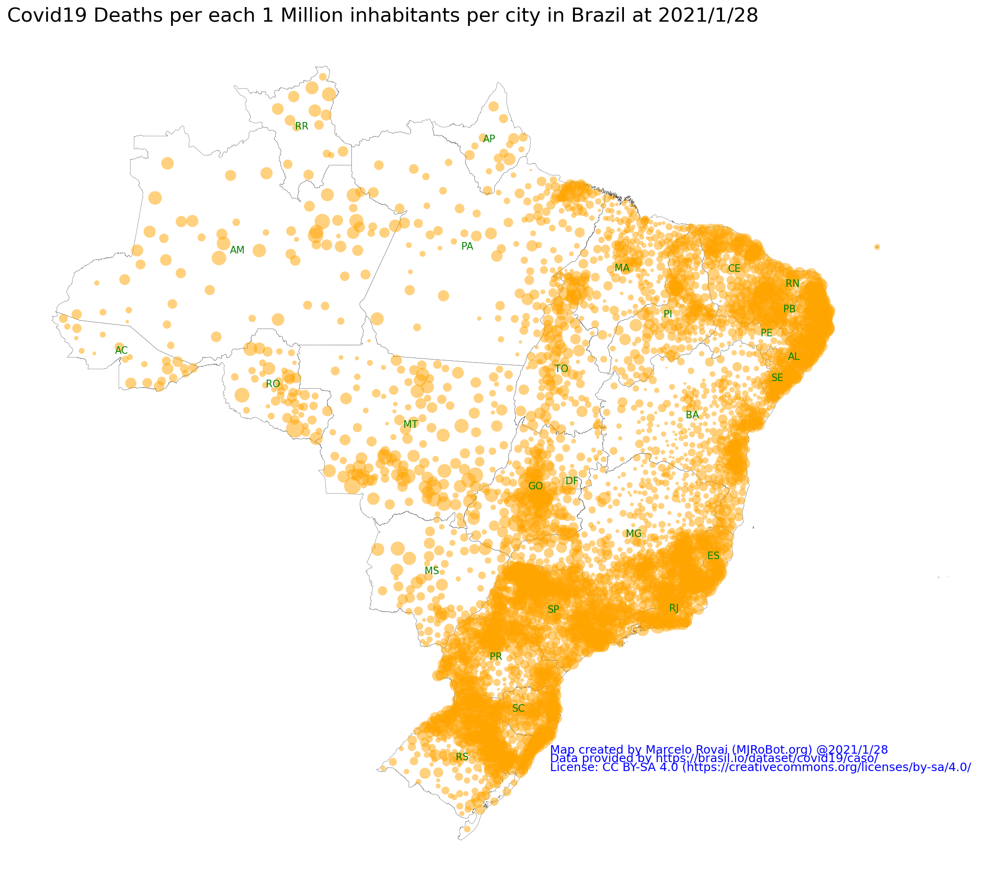

In [24]:
plt_Brasil_cv_metrics(cv_city_pnt,
                      deaths_city_pnt,
                      date,
                      total_cases,
                      deaths,
                      cfr,
                      br_shp,
                      br_cities,
                      metrics='Deaths/1M pop',
                      n=0.1)

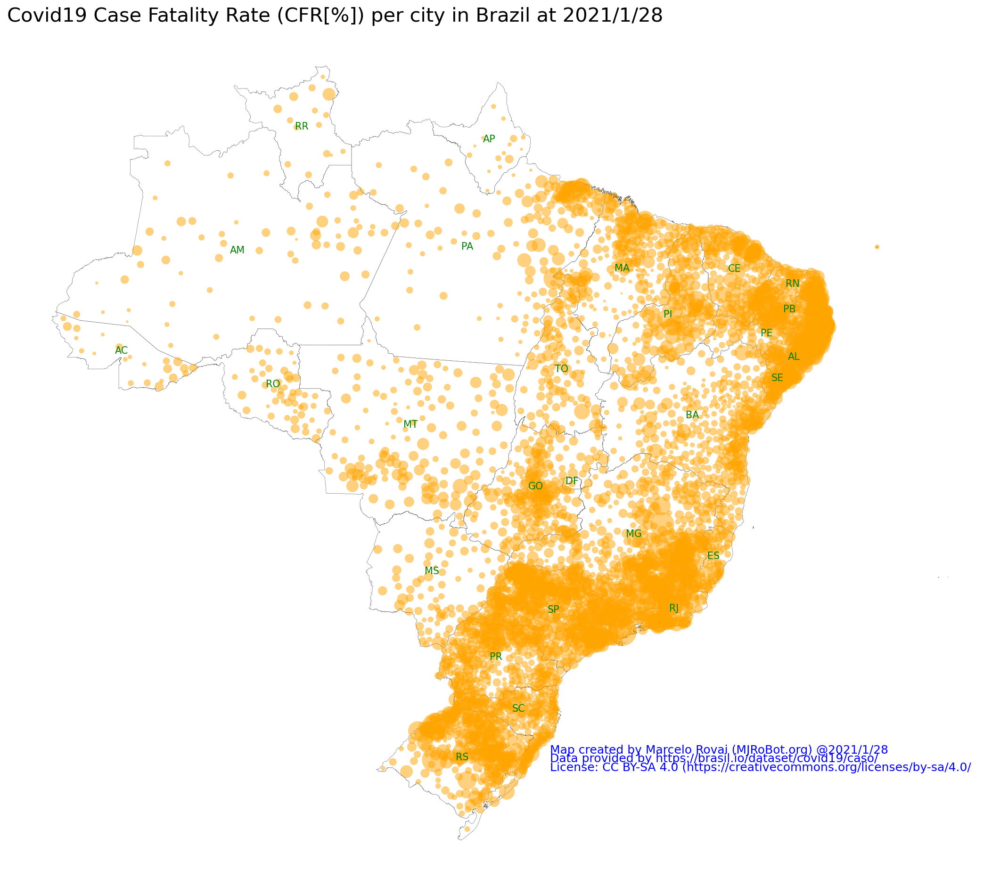

In [25]:
plt_Brasil_cv_metrics(cv_city_pnt,
                      deaths_city_pnt,
                      date,
                      total_cases,
                      deaths,
                      cfr,
                      br_shp,
                      br_cities,
                      metrics='CFR[%]',
                      n=30)

## Selected State Analysis

Total number of Covid19 cases reported in SP State at 1/28: 1,731,294 (52,170 fatal) in 645 specified cities


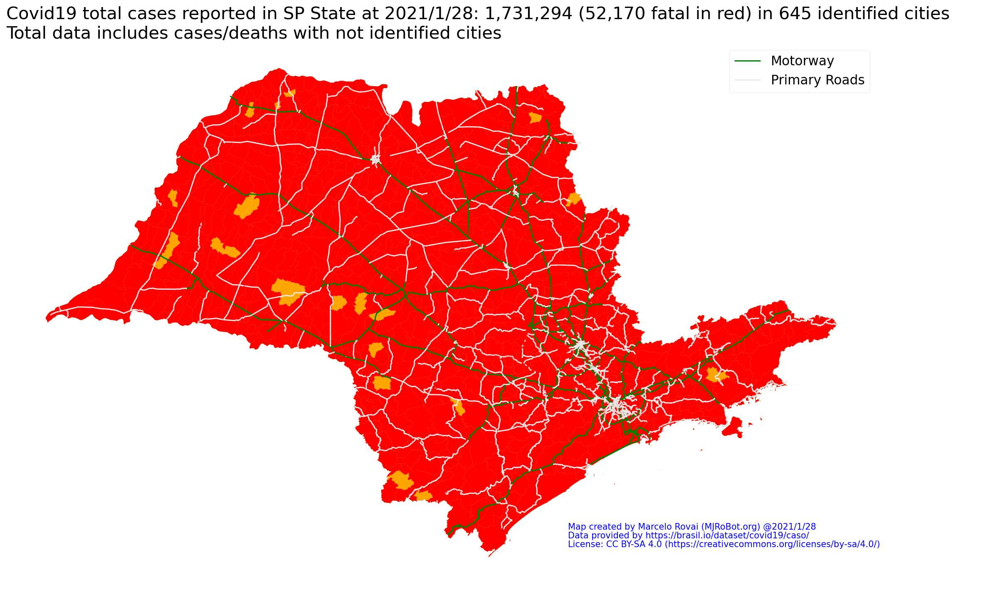

In [26]:
cv_sp, deaths_sp, sp_total_cases, sp_deaths = get_state_info(
    cv_city, dt_state, br_shp, br_cities, 'SP')

Total number of Covid19 cases reported in RJ State at 1/28: 509,113 (29,230 fatal) in 92 specified cities


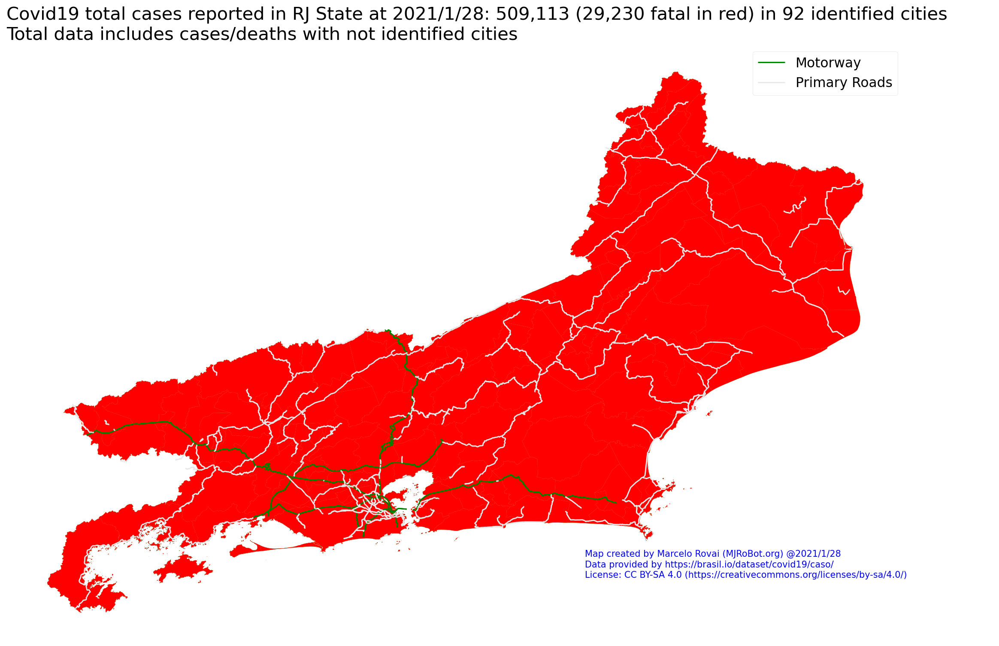

In [27]:
cv_rj, deaths_rj, rj_total_cases, rj_deaths = get_state_info(
    cv_city, dt_state, br_shp, br_cities, 'RJ')

Total number of Covid19 cases reported in MG State at 1/28: 707,649 (14,544 fatal) in 853 specified cities


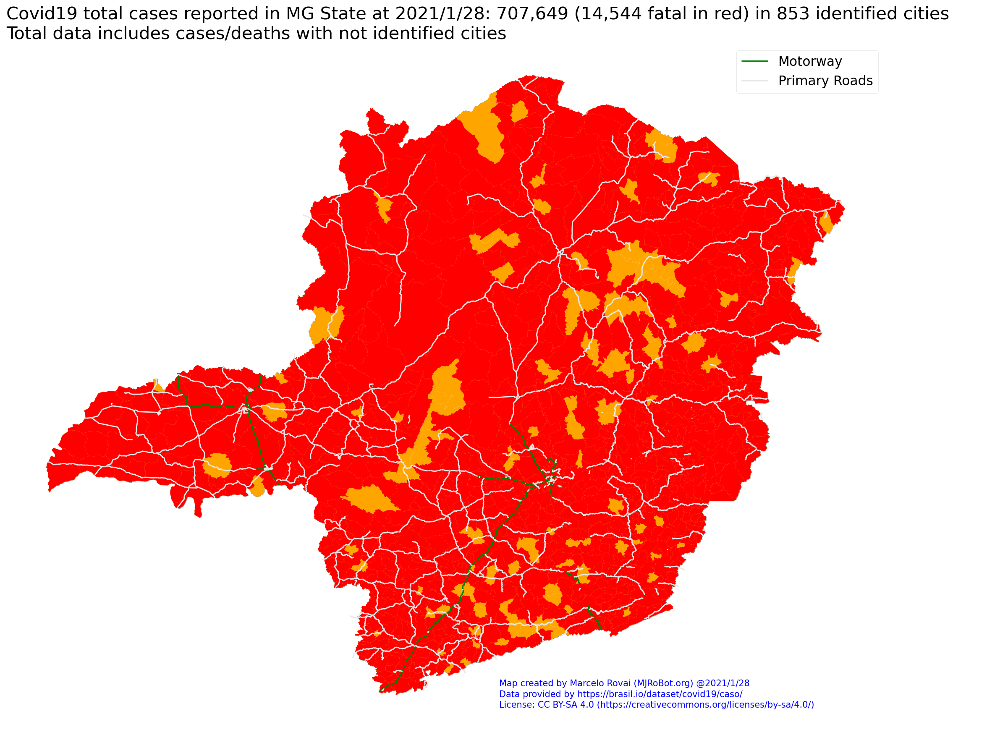

In [28]:
cv_mg, deaths_mg, mg_total_cases, mg_deaths = get_state_info(
    cv_city, dt_state, br_shp, br_cities, 'MG')

Total number of Covid19 cases reported in CE State at 1/28: 367,722 (10,423 fatal) in 184 specified cities


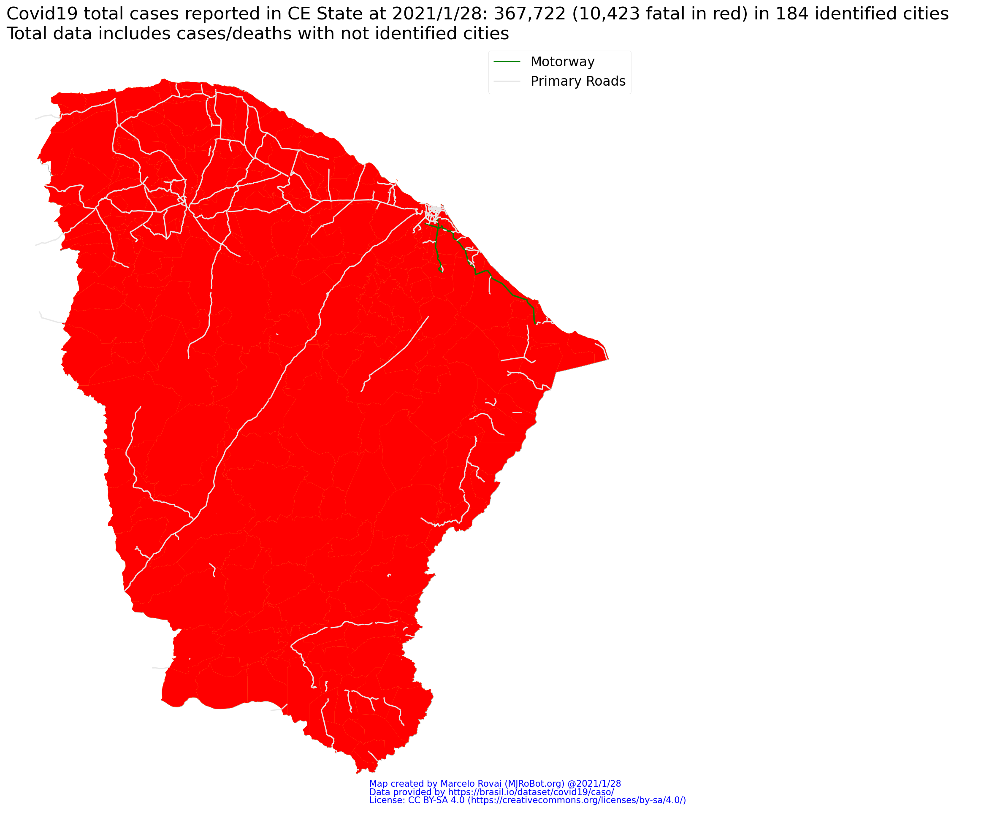

In [29]:
cv_ce, deaths_ce, ce_total_cases, ce_deaths = get_state_info(
    cv_city, dt_state, br_shp, br_cities, 'CE')

In [30]:
'''     
# Creating Gifs
print ('\n[INFO] Creating GIFs - WAIT ', end =" ")  

cv_city_t = pd.merge(br_cities, dt_tm_city, on='COD. IBGE')
deaths_city_t = cv_city_t.loc[cv_city_t['deaths'] != 0].copy()
dates = list(set(cv_city_t.date))
dates.sort()
dates = dates[-2:] 

create_state_gif(dates, cv_city_t, deaths_city_t, br_shp, 'BR') ; print ('.', end =" ") 
create_state_gif(dates, cv_city_t, deaths_city_t, br_shp, 'SP'); print ('.', end =" ") 
create_state_gif(dates, cv_city_t, deaths_city_t, br_shp, 'RJ'); print ('.', end =" ") 
create_state_gif(dates, cv_city_t, deaths_city_t, br_shp, 'MG'); print ('.', end =" ") 
create_state_gif(dates, cv_city_t, deaths_city_t, br_shp, 'CE'); print ('.')


### Creating videos from Gifs
print ('\n[INFO] Creating Movies - WAIT ', end =" ") 

conv_gif_to_mp4('BR', fps=5); print ('.', end =" ") 
conv_gif_to_mp4('SP', fps=5); print ('.', end =" ") 
conv_gif_to_mp4('RJ', fps=5); print ('.', end =" ") 
conv_gif_to_mp4('MG', fps=5); print ('.', end =" ") 
conv_gif_to_mp4('CE', fps=5); print ('.') 

'''

'     \n# Creating Gifs\nprint (\'\n[INFO] Creating GIFs - WAIT \', end =" ")  \n\ncv_city_t = pd.merge(br_cities, dt_tm_city, on=\'COD. IBGE\')\ndeaths_city_t = cv_city_t.loc[cv_city_t[\'deaths\'] != 0].copy()\ndates = list(set(cv_city_t.date))\ndates.sort()\ndates = dates[-2:] \n\ncreate_state_gif(dates, cv_city_t, deaths_city_t, br_shp, \'BR\') ; print (\'.\', end =" ") \ncreate_state_gif(dates, cv_city_t, deaths_city_t, br_shp, \'SP\'); print (\'.\', end =" ") \ncreate_state_gif(dates, cv_city_t, deaths_city_t, br_shp, \'RJ\'); print (\'.\', end =" ") \ncreate_state_gif(dates, cv_city_t, deaths_city_t, br_shp, \'MG\'); print (\'.\', end =" ") \ncreate_state_gif(dates, cv_city_t, deaths_city_t, br_shp, \'CE\'); print (\'.\')\n\n\n### Creating videos from Gifs\nprint (\'\n[INFO] Creating Movies - WAIT \', end =" ") \n\nconv_gif_to_mp4(\'BR\', fps=5); print (\'.\', end =" ") \nconv_gif_to_mp4(\'SP\', fps=5); print (\'.\', end =" ") \nconv_gif_to_mp4(\'RJ\', fps=5); print (\'.\', end =